In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


# library to handle JSON files
import json 

# library to handle requests
import requests 
from pandas.io.json import json_normalize 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans


print('Libraries imported.')

Libraries imported.


In [3]:
import matplotlib as mpl

import matplotlib.pyplot as plt

import seaborn as sns

In [4]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

from matplotlib.figure import Figure

fig= Figure()

canvas = FigureCanvas(fig)

ax= fig.add_subplot(111)

In [5]:
import folium 
from folium import plugins

In [6]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering librar

Solving environment: ...working... done

# All requested packages already installed.



In [7]:
!conda install -c conda-forge geopy --yes

from geopy.geocoders import Nominatim 
# convert an address into latitude and longitude values

Solving environment: ...working... done

# All requested packages already installed.



# 1. Mining & Process Data

In [8]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
htmlCanada = pd.read_html(url)
Canada = pd.DataFrame(htmlCanada[0])

#### **Optional :  Load in computer Desktop**

In [10]:
path = "C:/Users/Mokht/OneDrive/Bureau/Project/Canada_Neigh.xlsx"

In [11]:
Canada.to_csv(path)

### Explore Data

In [9]:
Canada.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 3 columns):
Postcode         288 non-null object
Borough          288 non-null object
Neighbourhood    288 non-null object
dtypes: object(3)
memory usage: 6.8+ KB


In [ ]:
Canada.shape

In [ ]:
Canada.head(5)

## 1.2 Drop rows 'Not assigned' in column 'Borough'

In [10]:
Canada = Canada[Canada.Borough != 'Not assigned']

In [ ]:
Canada.shape

In [ ]:
Canada.info()

In [ ]:
Canada

## 1.3 Rename long names columns

In [11]:
Canada = Canada.rename(columns={'Postcode' : 'Post','Neighbourhood' : 'Neigh'})

In [11]:
Canada.shape

(211, 3)

In [ ]:
Canada.info()

## 1.4 Group Table into 'Post Code' & Borough. Merging the Neighborhood of each.
 *Obtain the DataFrame where the Neighborhood with same postal code it's merging*

In [12]:
dfcan = Canada.groupby(['Post','Borough'])['Neigh'].apply(','.join).reset_index()

In [13]:
dfcan.size

309

In [14]:
dfcan.shape

(103, 3)

In [15]:
dfcan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 3 columns):
Post       103 non-null object
Borough    103 non-null object
Neigh      103 non-null object
dtypes: object(3)
memory usage: 2.5+ KB


In [11]:
dfcan.head()

,Post,Borough,Neigh
0,M1B,Scarborough,"Rouge,Malvern"
1,M1C,Scarborough,"Highland Creek,Rouge Hill,Port Union"
2,M1E,Scarborough,"Guildwood,Morningside,West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [ ]:
dfcan

## 1.5 *Replace Na value in 'Neighborhood' with the 'Borough' value in this row*

In [13]:
dfcan['Neigh'] = dfcan['Neigh'].replace('Not assigned', dfcan.Borough)

In [13]:
dfcan.shape

(103, 3)

In [28]:
dfcan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 3 columns):
Post       103 non-null object
Borough    103 non-null object
Neigh      103 non-null object
dtypes: object(3)
memory usage: 2.5+ KB


In [ ]:
dfcan

# 1.6 Download, Read, and Create DataFrame of Geospatial coordinates 

In [14]:
Geo_path = 'C:/Users/Mokht/OneDrive/Bureau/Project/Geospatial_Coordinates.csv'

In [15]:
GeoRead = pd.read_csv(Geo_path)

In [16]:
df2 = pd.DataFrame(GeoRead)

In [17]:
df2 = df2.drop(['Postal Code'], axis=1)

In [ ]:
df2.info()

In [ ]:
df2.shape

In [ ]:
df2

## 1.7 Concat the 2 Tables. For DataFrame used to Explore & Clustering of Toronto 

In [18]:
Toronto = pd.concat([dfcan,df2] , axis=1)

In [17]:
Toronto.shape

(103, 5)

In [ ]:
Toronto.info()

In [ ]:
Toronto.head()

*Save the new DF*

In [ ]:
Tor_path = 'C:/Users/Mokht\OneDrive/Bureau/Toronto.xlsx'

In [ ]:
Toronto.to_csv(Tor_path)

## 1.8 *Count of each Borough*

In [19]:
Borough_count = Toronto['Borough'].value_counts()

In [18]:
Borough_count

North York          24
Downtown Toronto    18
Scarborough         17
Etobicoke           12
Central Toronto      9
West Toronto         6
East Toronto         5
East York            5
York                 5
Mississauga          1
Queen's Park         1
Name: Borough, dtype: int64

## Visualize that with Bar & Histogram

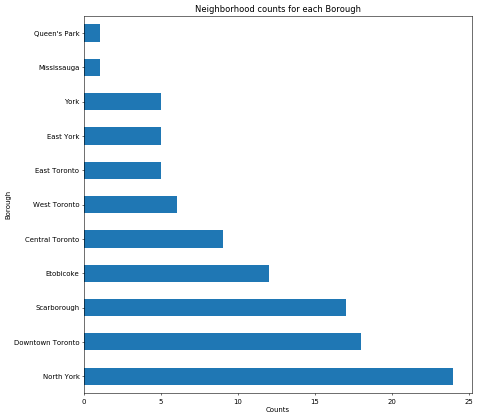

<Figure size 432x288 with 0 Axes>

In [20]:
plt.figure(figsize=(10,10), dpi=50)


Toronto.groupby('Borough')['Neigh'].count().nlargest(30).plot(kind='barh')

plt.title('Neighborhood counts for each Borough')
plt.xlabel('Counts')
plt.show()
plt.close()

plt.savefig('C:/Users/Mokht/OneDrive/Bureau/Map_Clust.png')

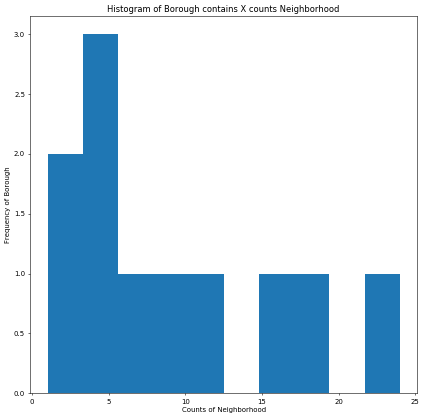

In [21]:
plt.figure(figsize=(10,10), dpi=50)


Toronto.groupby('Borough')['Neigh'].count().nlargest(30).plot(kind='hist')


plt.title('Histogram of Borough contains X counts Neighborhood')
plt.xlabel('Counts of Neighborhood')
plt.ylabel('Frequency of Borough')

plt.show()

# 2. Analyzing with Visualisation & Clustering

**2.1 Geographical coordinates of Toronto**

In [22]:
address = 'Toronto, Canada'

geolocator = Nominatim(user_agent="to_explorer")
location = geolocator.geocode(address)
latitude_Toronto = location.latitude
longitude_Toronto = location.longitude
print('The geograpical coordinate of Toronto City are {}, {}.'.format(latitude_Toronto, longitude_Toronto))

The geograpical coordinate of Toronto City are 43.653963, -79.387207.


### 2.2 Create map of Toronto City

In [23]:
# create map of Canada using latitude and longitude values
map_Toronto = folium.Map(location=[latitude_Toronto, longitude_Toronto], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(Toronto['Latitude'], Toronto['Longitude'], Toronto['Borough'], Toronto['Neigh']):
    label = '{}, {}'.format([neighborhood], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Toronto)  
    
map_Toronto

## 2.3 Create DataFrame with Borough contains 'Toronto'

Merge table to obtain the Table with only 'Toronto' Borough

In [24]:
Borough_Toronto =   Toronto[Toronto['Borough'].str.contains('Downtown Toronto')]

In [25]:
Borough_Toronto

,Post,Borough,Neigh,Latitude,Longitude
50,M4W,Downtown Toronto,Rosedale,43.679563,-79.377529
51,M4X,Downtown Toronto,"Cabbagetown,St. James Town",43.667967,-79.367675
52,M4Y,Downtown Toronto,Church and Wellesley,43.665860,-79.383160
53,M5A,Downtown Toronto,"Harbourfront,Regent Park",43.654260,-79.360636
54,M5B,Downtown Toronto,"Ryerson,Garden District",43.657162,-79.378937
55,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418
56,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306
57,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383
58,M5H,Downtown Toronto,"Adelaide,King,Richmond",43.650571,-79.384568
59,M5J,Downtown Toronto,"Harbourfront East,Toronto Islands,Union Station",43.640816,-79.381752


In [25]:
Borough_Toronto.shape

(18, 5)

In [26]:
Borough_Toronto.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 50 to 75
Data columns (total 5 columns):
Post         18 non-null object
Borough      18 non-null object
Neigh        18 non-null object
Latitude     18 non-null float64
Longitude    18 non-null float64
dtypes: float64(2), object(3)
memory usage: 864.0+ bytes


## 2.4 Get adress with Geocoder

The geograpical coordinate of Toronto City are 43.653963, -79.387207.

In [26]:
address = 'Downtown Toronto, Toronto '

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_Borough = location.latitude
longitude_Borough = location.longitude
print('The geograpical coordinate of Toronto Borough are {}, {}.'.format(latitude_Borough, longitude_Borough))

The geograpical coordinate of Toronto Borough are 43.6541737, -79.3808116451341.


## 2.5 **Create Map**

In [27]:
# create map of Canada using latitude and longitude values

map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

Creditentials for FourSquare Users

In [ ]:
CLIENT_ID = ''

CLIENT_SECRET = ''

VERSION = ''

In [28]:
CLIENT_ID = 'WDGB5RLTXORZQXYCEU4HJRBBO3CP5IDQ3AF1Z1GU0DS4HJ4R'

CLIENT_SECRET = 'RMMQ1XATUABGPIVD45OXCIHXUGOWZQPRXJFQ55JE3ONVDMDO'

VERSION = '20190730'

# 2.7 TOP 100 venues of Toronto, with 500 radius
## *Get Url Foursquare Api Request*

In [29]:
# type your answer here
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 350 # define radius


# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Borough, 
    longitude_Borough, 
    radius, 
    LIMIT)

url # display URL


'https://api.foursquare.com/v2/venues/explore?&client_id=WDGB5RLTXORZQXYCEU4HJRBBO3CP5IDQ3AF1Z1GU0DS4HJ4R&client_secret=RMMQ1XATUABGPIVD45OXCIHXUGOWZQPRXJFQ55JE3ONVDMDO&v=20190730&ll=43.6541737,-79.3808116451341&radius=350&limit=100'

### Send request & Get result

In [30]:
results = requests.get(url).json()

In [ ]:
results

# 2.8 All information is in the items key. Before we proceed, let's borrow the get_category_type function from the Foursquare lab.

In [31]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']    

## *Clean Json & Structure it into DF*

In [32]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues

,name,categories,lat,lng
0,UNIQLO ユニクロ,Clothing Store,43.655910,-79.380641
1,Elgin And Winter Garden Theatres,Theater,43.653394,-79.378507
2,Indigo,Bookstore,43.653515,-79.380696
3,Ed Mirvish Theatre,Theater,43.655102,-79.379768
4,Eggspectation Bell Trinity Square,Breakfast Spot,43.653144,-79.381980
5,CF Toronto Eaton Centre,Shopping Mall,43.654265,-79.380567
6,Yonge-Dundas Square,Plaza,43.656054,-79.380495
7,SEPHORA,Cosmetics Shop,43.653688,-79.380120
8,HomeSense,Furniture / Home Store,43.653187,-79.379237
9,Nordstrom,Clothing Store,43.655041,-79.380966


In [30]:
nearby_path = 'C:/Users/Mokht\OneDrive/Bureau/350Down_Nearby_Venues_Toronto.xlsx'

In [31]:
nearby_venues.to_csv(nearby_path)

# 2.9  Explore Neighborhoods in Downtown Toronto 

 #### *Let's create a function to repeat the same process to all the neighborhoods in Toronto*

In [33]:
def getNearbyVenues(names, latitudes, longitudes, radius=400):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [48]:
nearby_venues.shape

(88, 4)

In [48]:
nearby_venues.head()

,name,categories,lat,lng
0,UNIQLO ユニクロ,Clothing Store,43.655910,-79.380641
1,Elgin And Winter Garden Theatres,Theater,43.653394,-79.378507
2,Indigo,Bookstore,43.653515,-79.380696
3,Ed Mirvish Theatre,Theater,43.655102,-79.379768
4,Eggspectation Bell Trinity Square,Breakfast Spot,43.653144,-79.381980


In [34]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(nearby_venues['lat'], nearby_venues['lng'],
                             nearby_venues['name'],nearby_venues['categories']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

map_Borough

## Map first nearby_venues + Borough

In [35]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)


for latven, lngven, ven, cat in zip(nearby_venues['lat'], nearby_venues['lng'], nearby_venues['name'],nearby_venues['categories']):

    label = '{}, {}'.format([cat],ven)
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.7,
    parse_html=False).add_to(map_Borough)

for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# 2.10 *Code to run the above function on each neighborhood and create a new dataframe called Borough_Toronto_venues*

In [225]:
Borough_Toronto.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 50 to 75
Data columns (total 5 columns):
Post         18 non-null object
Borough      18 non-null object
Neigh        18 non-null object
Latitude     18 non-null float64
Longitude    18 non-null float64
dtypes: float64(2), object(3)
memory usage: 864.0+ bytes


In [36]:
Borough_Toronto_venues = getNearbyVenues(names=Borough_Toronto['Neigh'],
                                   latitudes=Borough_Toronto['Latitude'],
                                   longitudes=Borough_Toronto['Longitude']
                                  )

Rosedale
Cabbagetown,St. James Town
Church and Wellesley
Harbourfront,Regent Park
Ryerson,Garden District
St. James Town
Berczy Park
Central Bay Street
Adelaide,King,Richmond
Harbourfront East,Toronto Islands,Union Station
Design Exchange,Toronto Dominion Centre
Commerce Court,Victoria Hotel
Harbord,University of Toronto
Chinatown,Grange Park,Kensington Market
CN Tower,Bathurst Quay,Island airport,Harbourfront West,King and Spadina,Railway Lands,South Niagara
Stn A PO Boxes 25 The Esplanade
First Canadian Place,Underground city
Christie


In [40]:
print(Borough_Toronto_venues.shape)
Borough_Toronto_venues.head()

(1057, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Rosedale,43.679563,-79.377529,Mooredale House,43.678631,-79.380091,Building
1,Rosedale,43.679563,-79.377529,Rosedale Park,43.682328,-79.378934,Playground
2,Rosedale,43.679563,-79.377529,Betline Trail at Roxborough dr.,43.680530,-79.381490,Bike Trail
3,"Cabbagetown,St. James Town",43.667967,-79.367675,Cranberries,43.667843,-79.369407,Diner
4,"Cabbagetown,St. James Town",43.667967,-79.367675,F'Amelia,43.667536,-79.368613,Italian Restaurant


# 2.11 Map The Venue

In [37]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                             Borough_Toronto_venues['Venue'],Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)


map_Borough

# Map venues + Downtown Neighborhood

In [38]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                             Borough_Toronto_venues['Venue'],Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

In [110]:
Neigh_Tor = Borough_Toronto_venues.groupby('Neighborhood')

# 2.12 Check how many venues in each Neighborhood

In [43]:
Count_Borough_Venues = Borough_Toronto_venues.groupby('Neighborhood')[['Venue']].count()
Count_Borough_Venues = Count_Borough_Venues.sort_values(by='Venue', ascending=True)

## Visualiz of venues for each Neighborhood

<Figure size 500x500 with 0 Axes>

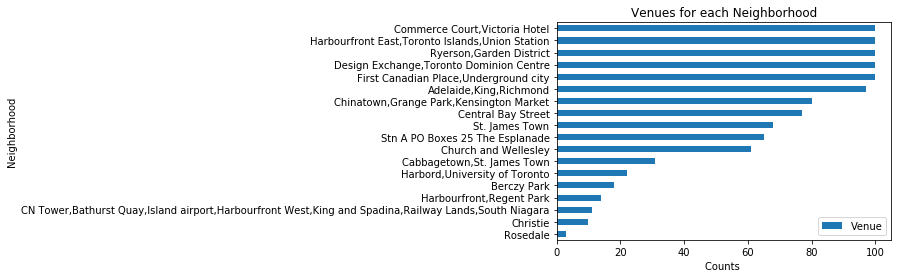

In [44]:
plt.figure(figsize=(10,10), dpi=50)

Count_Borough_Venues.plot(kind='barh')

plt.xlabel('Counts ')
plt.ylabel('Neighborhood')
plt.title('Venues for each Neighborhood')
plt.show()

Text(0, 0.5, 'Frequency of Neighborhood')

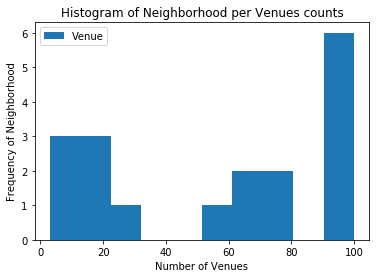

In [45]:
Count_Borough_Venues.plot.hist()

plt.title('Histogram of Neighborhood per Venues counts')
plt.xlabel('Number of Venues')
plt.ylabel('Frequency of Neighborhood')

# Go look Eat venues populars in Toronto (indirect & direct)

## Populars Food Venues


In [39]:
Food_venues = Borough_Toronto_venues[Borough_Toronto_venues.Venue.str.contains('Food')]

In [46]:
Food_venues.shape

(20, 7)

In [43]:
Food_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
90,Church and Wellesley,43.665860,-79.383160,Noah's Natural Foods,43.668532,-79.385885,Food & Drink Shop
152,"Ryerson,Garden District",43.657162,-79.378937,Paramount Fine Foods,43.655029,-79.380245,Middle Eastern Restaurant
222,St. James Town,43.651494,-79.375418,Hawthorne Food and Drink,43.652270,-79.376318,Gastropub
269,St. James Town,43.651494,-79.375418,Saks Food Hall by Pusateri's,43.652269,-79.379793,Food & Drink Shop
427,"Adelaide,King,Richmond",43.650571,-79.384568,iQ Food Co. (First Canadian Place),43.648357,-79.382192,Salad Place


Text(0.5, 1.0, 'Food Categories')

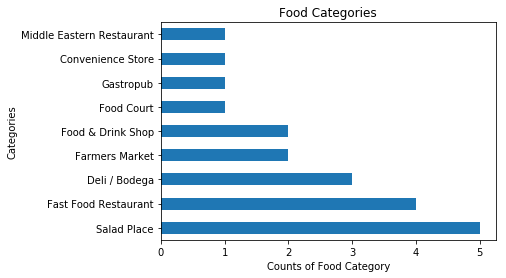

In [40]:
Food_venues['Venue Category'].value_counts().plot(kind='barh')

plt.xlabel('Counts of Food Category')
plt.ylabel('Categories')

plt.title('Food Categories')

Text(0.5, 1.0, 'Counts of Venues Food')

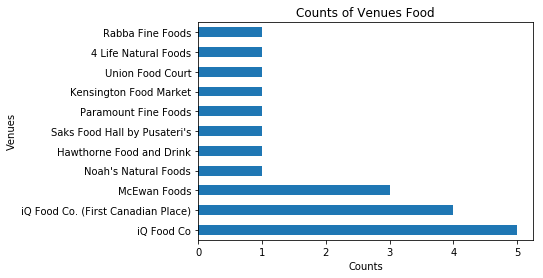

In [41]:
Food_venues['Venue'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Venues')
plt.title('Counts of Venues Food')

## Map Food (Indirect concurencies)

In [42]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

#  Popular Burger venues

In [43]:
Burger_venues = Borough_Toronto_venues[Borough_Toronto_venues.Venue.str.contains('Burger')]

In [55]:
Burger_venues.shape

(10, 7)

Text(0.5, 1.0, 'Burger Category')

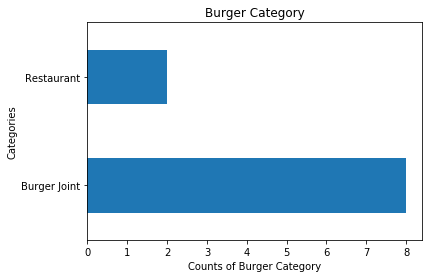

In [44]:
Burger_venues['Venue Category'].value_counts().plot(kind='barh')
plt.xlabel('Counts of Burger Category')
plt.ylabel('Categories')

plt.title('Burger Category')

Text(0.5, 1.0, 'Burger per Neighborhood')

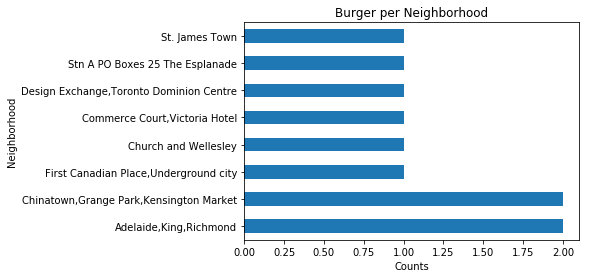

In [45]:
Burger_venues['Neighborhood'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Neighborhood')
plt.title('Burger per Neighborhood')

Text(0.5, 1.0, 'Counts of Burger franchises')

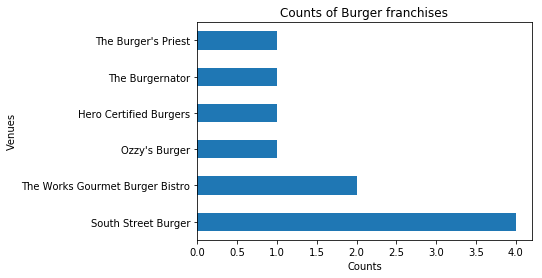

In [46]:
Burger_venues['Venue'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Venues')
plt.title('Counts of Burger franchises')

In [47]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# Popular Restaurant venues (direct concurencies)

In [48]:
Restaurant_venues = Borough_Toronto_venues[Borough_Toronto_venues.Venue.str.contains('Restaurant')]

In [58]:
Restaurant_venues.shape

(23, 7)

In [55]:
Restaurant_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
46,Church and Wellesley,43.665860,-79.383160,Coach House Restaurant,43.664991,-79.384814,Diner
118,"Ryerson,Garden District",43.657162,-79.378937,The Senator Restaurant,43.655641,-79.379199,Diner
157,"Ryerson,Garden District",43.657162,-79.378937,The Elm Tree Restaurant,43.657397,-79.383761,Modern European Restaurant
179,"Ryerson,Garden District",43.657162,-79.378937,Citrus Restaurant & Lounge @ The Grand Hotel,43.656273,-79.374221,Lounge
213,St. James Town,43.651494,-79.375418,GEORGE Restaurant,43.653346,-79.374445,Restaurant


Text(0.5, 1.0, ' Popular Restaurant franchises')

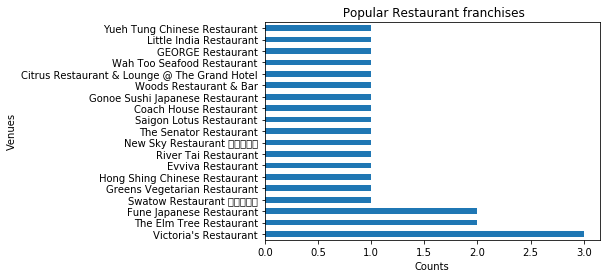

In [49]:
Restaurant_venues['Venue'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Venues')
plt.title(' Popular Restaurant franchises')

Text(0.5, 1.0, 'Restaurant Categories')

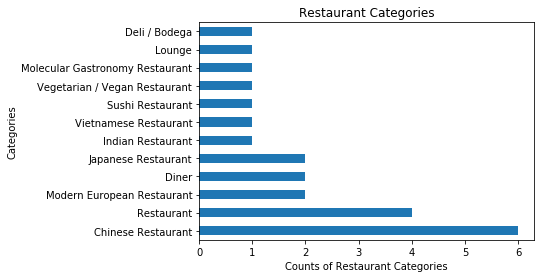

In [50]:
Restaurant_venues['Venue Category'].value_counts().plot(kind='barh')

plt.xlabel('Counts of Restaurant Categories')
plt.ylabel('Categories')

plt.title('Restaurant Categories')

Text(0.5, 1.0, 'Restaurant per Neighborhood')

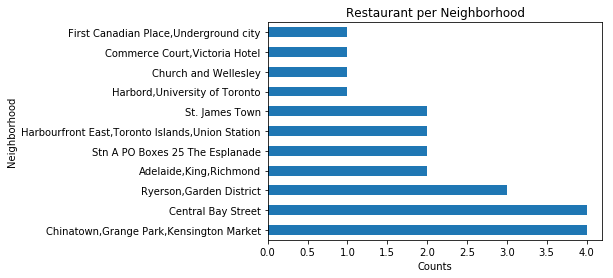

In [51]:
Restaurant_venues['Neighborhood'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Neighborhood')
plt.title('Restaurant per Neighborhood')

# Map Restaurant Direct concurencies

In [52]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='orange',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# Map Populars Burger + Food + Restaurant

In [53]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)
    
    
for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='orange',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# Full map Eat distinct + Venues

In [54]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)



    
for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                                    Borough_Toronto_venues['Venue'], Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='gray',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)
    

for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)
    

for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='orange',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# Full Map Eat same colors + Venues

In [55]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)



    
for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                                    Borough_Toronto_venues['Venue'], Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='gray',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)
    
for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)
    
for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=5,
    popup=label,
    color='red',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(map_Borough)

# add markers to map
for lat, lng, borough, neigh in zip(Borough_Toronto['Latitude'], Borough_Toronto['Longitude'],Borough_Toronto['Borough'], Borough_Toronto['Neigh']):
    
    label = '{}, {}'.format([neigh], borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Borough)  
    
map_Borough

# Count Venues Category

In [56]:
Count_Venues_Categ = Borough_Toronto_venues.groupby('Venue Category')[['Venue']].count()

In [55]:
Count_Venues_Categ .head()

,Venue
Venue Category,
Airport,1
Airport Food Court,1
Airport Gate,1
Airport Lounge,2
Airport Service,1


Text(0.5, 0, 'Counts')

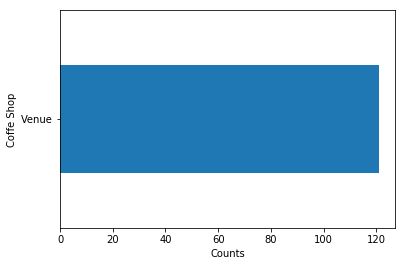

In [57]:
Count_Venues_Categ.max().plot(kind='barh')

plt.ylabel('Coffe Shop')
plt.xlabel('Counts')

# Visu Distributions of Venues Categories per Venues counts

<Figure size 2000x2000 with 0 Axes>

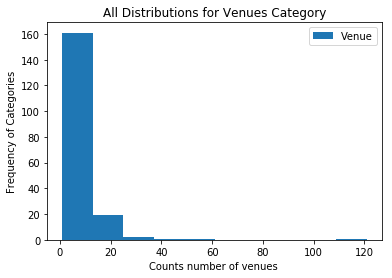

In [58]:
plt.figure(figsize=(20,20), dpi=100)

Count_Venues_Categ.plot(kind='hist')

plt.title('All Distributions for Venues Category')
plt.xlabel('Counts number of venues ')
plt.ylabel('Frequency of Categories')
plt.show()

# Group each Neighborhood with the Venue Category & Venues Counts

In [59]:
Neigh_Venues = Borough_Toronto_venues.groupby(['Neighborhood','Venue Category'])[['Venue']].count()

In [66]:
Neigh_Venues.head()

Venue
Neighborhood           Venue Category            
Adelaide,King,Richmond American Restaurant      3
                       Asian Restaurant         3
                       Bakery                   1
                       Bank                     1
                       Bar                      3

# Bar for lengh of venues in this categories

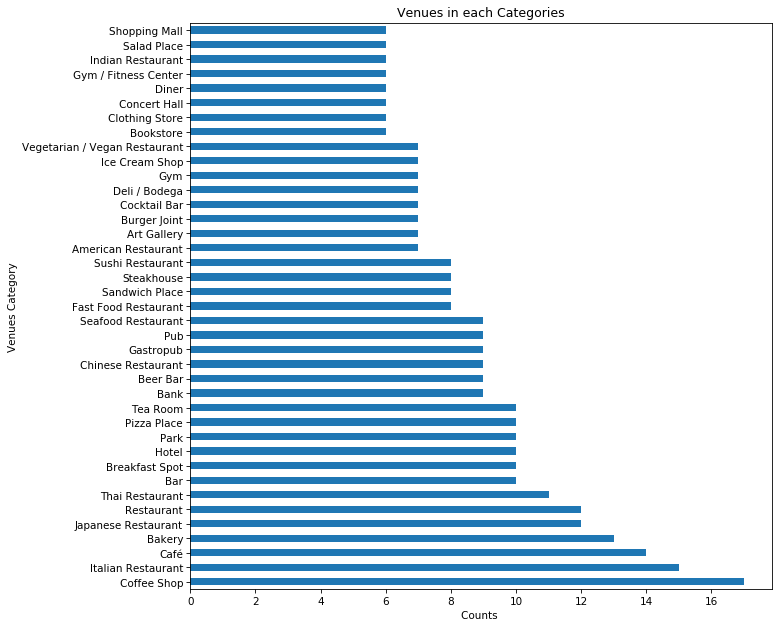

In [63]:
plt.figure(figsize=(10,10), dpi=75)

Neigh_Venues.groupby('Venue Category')['Venue'].count().nlargest(39).plot(kind='barh')

plt.xlabel('Counts ')
plt.ylabel('Venues Category')
plt.title('Venues in each Categories')
plt.show()

# Histogram of categories with this counts

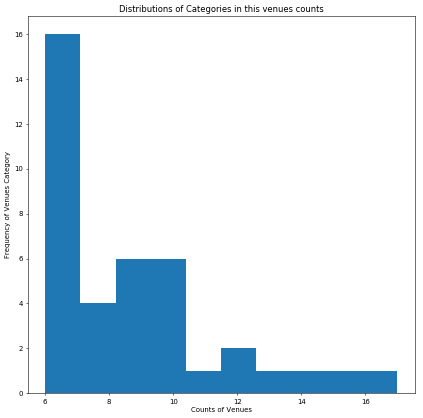

In [65]:
plt.figure(figsize=(10,10), dpi=50)


Neigh_Venues.groupby('Venue Category')['Venue'].count().nlargest(39).plot(kind='hist')

plt.xlabel('Counts of Venues')

plt.ylabel('Frequency of Venues Category')

plt.title('Distributions of Categories in this venues counts')
plt.show()

### 2.11 *Borough Toronto : Let's find out how many unique categories can be curated from all the returned venues*

In [86]:
print('There are {} uniques categories.'.format(len(Borough_Toronto_venues['Venue Category'].unique())))

There are 185 uniques categories.


In [87]:
 print('There are {} uniques venues.'.format(len(Borough_Toronto_venues['Venue'].unique())))

There are 659 uniques venues.


# Distributions of categories in this venues counts

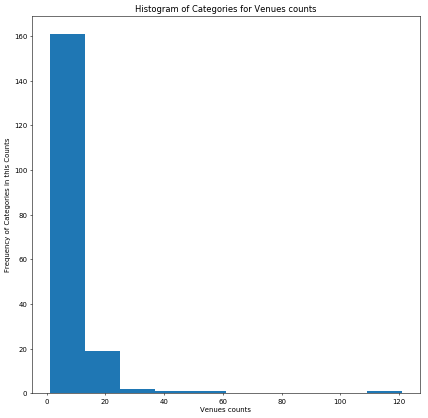

In [73]:
plt.figure(figsize=(10,10), dpi=50)

Borough_Toronto_venues['Venue Category'].value_counts().plot(kind='hist')

plt.title('Histogram of Categories for Venues counts')
plt.xlabel('Venues counts')
plt.ylabel('Frequency of Categories in this Counts')
plt.show()

Unique categories can be curated from all the returned venues in All Toronto

 ## TESTING : Others groupby

 Rows : number of venues

In [74]:
Borough_Venues_Sum = Borough_Toronto_venues.groupby('Venue').min()

In [ ]:
Borough_Venues_Sum.shape

In [100]:
Borough_Venues_Sum.info()

(659, 6)

In [91]:
Borough_Venues_Sum.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Latitude,Venue Longitude,Venue Category
Venue,,,,,,
306 Yonge Street - Jordan Store,"Ryerson,Garden District",43.657162,-79.378937,43.656495,-79.381015,Sporting Goods Shop
4 Life Natural Foods,"Chinatown,Grange Park,Kensington Market",43.653206,-79.400049,43.655275,-79.402374,Farmers Market
401 Games,Church and Wellesley,43.665860,-79.383160,43.663623,-79.384037,Hobby Shop
A & C Games,"Harbord,University of Toronto",43.662696,-79.400049,43.664939,-79.403194,Video Game Store
A&W,"Harbourfront East,Toronto Islands,Union Station",43.640816,-79.381752,43.641367,-79.377942,Fast Food Restaurant


# Here, Rows = number of Categories venues

In [ ]:
Categ_Bor_venues = Borough_Toronto_venues.groupby('Venue Category').max()

In [ ]:
Categ_Bor_venues.shape

In [53]:
Categ_Bor_venues.info()

<class 'pandas.core.frame.DataFrame'>
Index: 239 entries, Afghan Restaurant to Yoga Studio
Data columns (total 6 columns):
Neighborhood              239 non-null object
Neighborhood Latitude     239 non-null float64
Neighborhood Longitude    239 non-null float64
Venue                     239 non-null object
Venue Latitude            239 non-null float64
Venue Longitude           239 non-null float64
dtypes: float64(4), object(2)
memory usage: 13.1+ KB


In [99]:
Categ_Bor_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
Venue Category,,,,,,
Airport,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,Billy Bishop Toronto City Airport (YTZ) (Billy...,43.631579,-79.395605
Airport Food Court,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,Billy Bishop Café,43.631132,-79.396139
Airport Gate,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,Gate 8,43.631536,-79.394570
Airport Lounge,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,Porter Lounge,43.631360,-79.395756
Airport Service,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,Porter Airlines Check-In Counter,43.631683,-79.395454


In [55]:
path = "C:/Users/Mokht/OneDrive/Bureau/Project/Cat_venues_Toronto.xlsx"

In [57]:
Categ_Bor_venues.to_csv(path)

# 3.1 Analysis of venues in Borough contains 'Toronto'

## *One hot encoding (divise Venues categories in columns)*

In [68]:
# one hot encoding
Borough_Toronto_onehot = pd.get_dummies(Borough_Toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Borough_Toronto_onehot['Neighborhood'] = Borough_Toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Borough_Toronto_onehot.columns[-1]] + list(Borough_Toronto_onehot.columns[:-1])
Borough_Toronto_onehot = Borough_Toronto_onehot[fixed_columns]


Borough_Toronto_onehot.head()

,Wings Joint,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beer Bar,Beer Store,Bike Trail,Bistro,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Camera Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gastropub,Gay Bar,General Entertainment,General Travel,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Health Food Store,History Museum,Hobby Shop,Hookah Bar,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Poutine Place,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Whisky Bar,Wine Bar
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Rosedale,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Rosedale,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Rosedale,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"Cabbagetown,St. James 

In [77]:
Borough_Toronto_onehot.shape

(1057, 185)

In [107]:
Borough_Toronto_onehot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1057 entries, 0 to 1056
Columns: 185 entries, Wings Joint to Wine Bar
dtypes: object(1), uint8(184)
memory usage: 198.3+ KB


# Means of Categories in each Neighborhood

## 3.2  Group rows by Neighborhood and by taking the Mean of the frequency of occurrence of each category.

In [69]:
Borough_Toronto_grouped = Borough_Toronto_onehot.groupby('Neighborhood').mean().reset_index()
Borough_Toronto_grouped.shape

(18, 185)

In [110]:
Borough_Toronto_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Columns: 185 entries, Neighborhood to Wine Bar
dtypes: float64(184), object(1)
memory usage: 26.1+ KB


In [79]:
Borough_Toronto_grouped.head(10)

,Neighborhood,Wings Joint,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Store,Bike Trail,Bistro,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Camera Store,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Ethiopian Restaurant,Farmers Market,Fast Food Restaurant,Festival,Fish Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gastropub,Gay Bar,General Entertainment,General Travel,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,History Museum,Hobby Shop,Hookah Bar,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Lounge,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Whisky Bar,Wine Bar
0,"Adelaide,King,Richmond",0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.038462,0.000000,0.000000,0.038462,0.0,0.0000,0.000000,0.000000,0.012821,0.038462,0.000000,0.00,0.0,0.00,0.0,0.000000,0.0,0.012821,0.000000,0.000000,0.012821,0.038462,0.000000,0.00,0.038462,0.0,0.0000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.076923,0.0,0.0,0.0,0.012821,0.000000,0.0,0.012821,0.0,0.0,0.012821,0.000000,0.012821,0.012821,0.012821,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0000,0.000000,0.012821,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.012821,0.025641,0.0000,0.000000,0.012821,0.012821,0.000000,0.012821,0.000000,0.000000,0.012821,0.0,0.0,0.012821,0.0,0.0,0.025641,0.000000,0.000000,0.000000,0.000000,0.012821,0.038462,0.012821,0.00,0.012821,0.0,0.0,0.000000,0.012821,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.012821,0.0,0.000000,0.0,0.000000,0.0000,0.012821,0.0,0.012821,0.000000,0.0,0.012821,0.0,0.012821,0.025641,0.0,0.012821,0.0,0.000000,0.000000,0.012821,0.012821,0.0,0.000000,0.025641,0.012821,0.000000,0.0,0.000000,0.025641,0.0,0.000000,0.0,0.012821,0.000000,0.000000,0.000000,0.000000,0.012821,0.000000,0.000000,0.051282,0.000000,0.0,0.025641,0.0,0.000000,0.0,0.012821,0.025641,0.0,0.000000,0.000000,0.000000,0.025641,0.0,0.000000,0.0,0.012821
1,Berczy Park,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.111111,0.00,0.0,0.00,0.0,0.000000,0.0,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0000,0.000000,0.000000,0.000000,0.0,0.111111,0

# Frequence of venues

## 3.3 Print the Frequence Top 10 venues in Toronto [Neighborhood]

In [70]:
num_top_venues = 10

for hood in Borough_Toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Borough_Toronto_grouped[Borough_Toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Adelaide,King,Richmond----
                 venue  freq
0          Coffee Shop  0.06
1                 Café  0.04
2           Steakhouse  0.04
3  Japanese Restaurant  0.04
4                  Bar  0.03
5         Burger Joint  0.03
6      Thai Restaurant  0.03
7     Sushi Restaurant  0.03
8  American Restaurant  0.03
9                Hotel  0.03


----Berczy Park----
                     venue  freq
0             Cocktail Bar  0.11
1                   Lounge  0.06
2  Comfort Food Restaurant  0.06
3           Clothing Store  0.06
4                 Beer Bar  0.06
5               Steakhouse  0.06
6              Coffee Shop  0.06
7             Liquor Store  0.06
8           Breakfast Spot  0.06
9                 Fountain  0.06


----CN Tower,Bathurst Quay,Island airport,Harbourfront West,King and Spadina,Railway Lands,South Niagara----
                venue  freq
0      Airport Lounge  0.18
1    Airport Terminal  0.18
2             Airport  0.09
3  Airport Food Court  0.09
4        Airpo

# Create a DataFrame with this Frequence

## 3.4 Function for put it in DataFrame

 First, let's write a function to sort the venues in descending order.

In [71]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

## 3.5 Create new DF to display the top 10 venues for each neighborhood.*

In [72]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neigh']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Borough_venues_sorted = pd.DataFrame(columns=columns)
Borough_venues_sorted['Neigh'] = Borough_Toronto_grouped['Neighborhood']

for ind in np.arange(Borough_Toronto_grouped.shape[0]):
    Borough_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Borough_Toronto_grouped.iloc[ind, :], num_top_venues)

Borough_venues_sorted.head()


,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Adelaide,King,Richmond",Coffee Shop,Japanese Restaurant,Steakhouse,Café,American Restaurant,Asian Restaurant,Hotel,Bar,Sushi Restaurant,Thai Restaurant
1,Berczy Park,Cocktail Bar,Liquor Store,Fountain,Park,Coffee Shop,Clothing Store,Breakfast Spot,Lounge,Concert Hall,Beer Bar
2,"CN Tower,Bathurst Quay,Island airport,Harbourf...",Airport Lounge,Airport Terminal,Boutique,Coffee Shop,Airport,Airport Food Court,Airport Gate,Airport Service,Bar,Dog Run
3,"Cabbagetown,St. James Town",Coffee Shop,Restaurant,Café,Pizza Place,Japanese Restaurant,Indian Restaurant,Pub,Italian Restaurant,Beer Store,Bistro
4,Central Bay Street,Coffee Shop,Sandwich Place,Italian Restaurant,Café,Chinese Restaurant,Sushi Restaurant,Tea Room,Bubble Tea Shop,Spa,Indian Restaurant


In [72]:
Borough_venues_sorted.shape

(18, 11)

In [84]:
Borough_venues_sorted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 11 columns):
Neigh                     18 non-null object
1st Most Common Venue     18 non-null object
2nd Most Common Venue     18 non-null object
3rd Most Common Venue     18 non-null object
4th Most Common Venue     18 non-null object
5th Most Common Venue     18 non-null object
6th Most Common Venue     18 non-null object
7th Most Common Venue     18 non-null object
8th Most Common Venue     18 non-null object
9th Most Common Venue     18 non-null object
10th Most Common Venue    18 non-null object
dtypes: object(11)
memory usage: 1.6+ KB


. 
# 4. Clustering 

## 4.1 Go Clustering

# Run k-means to cluster the neighborhood into 5 clusters.*

In [73]:
# set number of clusters
kclusters = 5

Bor_Toronto_clustering = Borough_Toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Bor_Toronto_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 3, 0, 0, 0, 2, 0, 0, 0])

In [89]:
Bor_Toronto_clustering

,Wings Joint,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beer Bar,Beer Store,Bike Trail,Bistro,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Camera Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gastropub,Gay Bar,General Entertainment,General Travel,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Health Food Store,History Museum,Hobby Shop,Hookah Bar,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Poutine Place,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Whisky Bar,Wine Bar
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030928,0.00,0.000000,0.000000,0.030928,0.000000,0.0,0.000000,0.010309,0.010309,0.030928,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010309,0.020619,0.00,0.000000,0.010309,0.030928,0.020619,0.000000,0.041237,0.000000,0.000,0.000000,0.000000,0.000000,0.010309,0.000000,0.061856,0.000000,0.000000,0.00,0.010309,0.000000,0.00,0.010309,0.00,0.00,0.010309,0.000000,0.010309,0.010309,0.010309,0.010309,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.010309,0.000000,0.000000,0.000000,0.00,0.000000,0.0000,0.010309,0.020619,0.00000,0.000000,0.010309,0.010309,0.000000,0.010309,0.000000,0.010309,0.010309,0.000000,0.00,0.010309,0.00,0.000000,0.030928,0.00,0.000000,0.010309,0.000000,0.010309,0.041237,0.010309,0.000000,0.010309,0.00,0.000000,0.000000,0.010309,0.000000,0.0000,0.010309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010309,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.010309,0.010309,0.010309,0.0000,0.00,0.010309,0.00,0.010309,0.010309,0.020619,0.000000,0.010309,0.000000,0.0000,0.000000,0.010309,0.010309,0.010309,0.00,0.000000,0.020619,0.020619,0.000000,0.00,0.000000,0.020619,0.00,0.000000,0.00,0.010309,0.000000,0.000000,0.00,0.000000,0.010309,0.000000,0.000000,0.041237,0.000000,0.00,0.030928,0.00,0.000000,0.00,0.01030

In [84]:
Borough_Toronto_grouped.head()

,Neighborhood,Wings Joint,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beer Bar,Beer Store,Bike Trail,Bistro,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Camera Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gastropub,Gay Bar,General Entertainment,General Travel,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Health Food Store,History Museum,Hobby Shop,Hookah Bar,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Poutine Place,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Whisky Bar,Wine Bar
0,"Adelaide,King,Richmond",0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030928,0.0,0.0,0.0,0.030928,0.0,0.0,0.0,0.010309,0.010309,0.030928,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.010309,0.020619,0.0,0.000000,0.010309,0.030928,0.020619,0.000000,0.041237,0.0,0.0,0.0,0.000000,0.0,0.010309,0.000000,0.061856,0.0,0.0,0.0,0.010309,0.000000,0.0,0.010309,0.0,0.0,0.010309,0.0,0.010309,0.010309,0.010309,0.010309,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.010309,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.010309,0.020619,0.0,0.000000,0.010309,0.010309,0.0,0.010309,0.000000,0.010309,0.010309,0.0,0.0,0.010309,0.0,0.0,0.030928,0.0,0.000000,0.010309,0.0,0.010309,0.041237,0.010309,0.000000,0.010309,0.0,0.0,0.000000,0.010309,0.000000,0.0,0.010309,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.010309,0.0,0.0,0.0,0.0,0.0,0.0,0.010309,0.010309,0.010309,0.0,0.0,0.010309,0.0,0.010309,0.010309,0.020619,0.000000,0.010309,0.000000,0.0,0.000000,0.010309,0.010309,0.010309,0.0,0.0,0.020619,0.020619,0.000000,0.0,0.0,0.020619,0.0,0.0,0.0,0.010309,0.000000,0.000000,0.0,0.000000,0.010309,0.0,0.0,0.041237,0.0,0.0,0.030928,0.0,0.0,0.0,0.010309,0.030928,0.0,0.0,0.0,0.0,0.0,0.020619,0.0,0.0,0.0,0.010309
1,Berczy Park,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0

## 4.2 Clustering the top 10 venues

 *Drop used for debugging* 

In [151]:
Borough_venues_sorted = Borough_venues_sorted.drop('ClustLabels', axis=1)

In [90]:
Borough_venues_sorted.head()

,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Adelaide,King,Richmond",Coffee Shop,Japanese Restaurant,Steakhouse,Café,American Restaurant,Asian Restaurant,Hotel,Bar,Sushi Restaurant,Thai Restaurant
1,Berczy Park,Cocktail Bar,Liquor Store,Fountain,Park,Coffee Shop,Clothing Store,Breakfast Spot,Lounge,Concert Hall,Beer Bar
2,"CN Tower,Bathurst Quay,Island airport,Harbourf...",Airport Lounge,Airport Terminal,Boutique,Coffee Shop,Airport,Airport Food Court,Airport Gate,Airport Service,Bar,Dog Run
3,"Cabbagetown,St. James Town",Coffee Shop,Restaurant,Café,Pizza Place,Japanese Restaurant,Indian Restaurant,Pub,Italian Restaurant,Beer Store,Bistro
4,Central Bay Street,Coffee Shop,Sandwich Place,Italian Restaurant,Café,Chinese Restaurant,Sushi Restaurant,Tea Room,Bubble Tea Shop,Spa,Indian Restaurant


#  Includes the cluster as well as the top 10 venues for each neighborhood

In [74]:
#add clustering labels
Borough_venues = Borough_venues_sorted.insert(0, 'ClustLabels', value= kmeans.labels_)

Borough_Merged = Borough_Toronto



# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
Borough_Merged = Borough_Merged.join(Borough_venues_sorted.set_index('Neigh'), on='Neigh')

Borough_Merged.head() # check the last columns!

,Post,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
50,M4W,Downtown Toronto,Rosedale,43.679563,-79.377529,1,Bike Trail,Playground,Building,Department Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Dog Run,Dive Bar,Discount Store
51,M4X,Downtown Toronto,"Cabbagetown,St. James Town",43.667967,-79.367675,0,Coffee Shop,Restaurant,Café,Pizza Place,Japanese Restaurant,Indian Restaurant,Pub,Italian Restaurant,Beer Store,Bistro
52,M4Y,Downtown Toronto,Church and Wellesley,43.665860,-79.383160,0,Coffee Shop,Restaurant,Japanese Restaurant,Gay Bar,Men's Store,Hotel,Gym,Bubble Tea Shop,Burrito Place,Breakfast Spot
53,M5A,Downtown Toronto,"Harbourfront,Regent Park",43.654260,-79.360636,4,Coffee Shop,Breakfast Spot,Park,Pub,Spa,Bank,Bakery,Restaurant,Electronics Store,Health Food Store
54,M5B,Downtown Toronto,"Ryerson,Garden District",43.657162,-79.378937,0,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Sandwich Place,Café,Cosmetics Shop,Hotel,Italian Restaurant,Restaurant,Plaza


In [109]:
Borough_Merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 50 to 75
Data columns (total 16 columns):
Post                      18 non-null object
Borough                   18 non-null object
Neigh                     18 non-null object
Latitude                  18 non-null float64
Longitude                 18 non-null float64
ClustLabels               18 non-null int32
1st Most Common Venue     18 non-null object
2nd Most Common Venue     18 non-null object
3rd Most Common Venue     18 non-null object
4th Most Common Venue     18 non-null object
5th Most Common Venue     18 non-null object
6th Most Common Venue     18 non-null object
7th Most Common Venue     18 non-null object
8th Most Common Venue     18 non-null object
9th Most Common Venue     18 non-null object
10th Most Common Venue    18 non-null object
dtypes: float64(2), int32(1), object(13)
memory usage: 2.3+ KB


In [298]:
Borough_Merged.shape

(18, 16)

## Sort table with ClustLabels

In [75]:
Borough_Merged_Clust = Borough_Merged.sort_values('ClustLabels', ascending=False)

In [ ]:
## Cluster 5 

In [76]:
Borough_Merged_Clust.head()

,Post,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
53,M5A,Downtown Toronto,"Harbourfront,Regent Park",43.654260,-79.360636,4,Coffee Shop,Breakfast Spot,Park,Pub,Spa,Bank,Bakery,Restaurant,Electronics Store,Health Food Store
68,M5V,Downtown Toronto,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.394420,3,Airport Lounge,Airport Terminal,Boutique,Coffee Shop,Airport,Airport Food Court,Airport Gate,Airport Service,Bar,Dog Run
75,M6G,Downtown Toronto,Christie,43.669542,-79.422564,2,Café,Grocery Store,Coffee Shop,Nightclub,Diner,Italian Restaurant,Baby Store,Wine Bar,Eastern European Restaurant,Dumpling Restaurant
50,M4W,Downtown Toronto,Rosedale,43.679563,-79.377529,1,Bike Trail,Playground,Building,Department Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Dog Run,Dive Bar,Discount Store
54,M5B,Downtown Toronto,"Ryerson,Garden District",43.657162,-79.378937,0,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Sandwich Place,Café,Cosmetics Shop,Hotel,Italian Restaurant,Restaurant,Plaza


Save DataFrame

In [89]:
Clust_path=  'C:/Users/Mokht\OneDrive/Bureau/K5_Tor_Clustering_Venues.xlsx'

In [90]:
Borough_Merged_Clust.to_csv(Clust_path)

# Visualisation of most commons venues in each Cluster

# Viz 1st Most common venue

C:\Users\Mokht\Anaconda3\lib\site-packages\pandas\plotting\_core.py:185: UserWarning: 'colors' is being deprecated. Please use 'color'instead of 'colors'
  warnings.warn(("'colors' is being deprecated. Please use 'color'"


Text(0.5, 1.0, 'Counts 1st Most Common Venue for 5 Clusters')

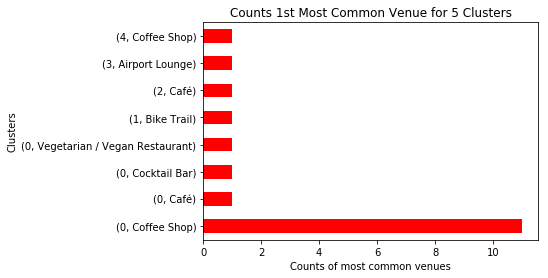

In [77]:
Borough_Merged_Clust.groupby('ClustLabels')['1st Most Common Venue'].value_counts().plot(kind='barh', colors='red')


plt.xlabel('Counts of most common venues')
plt.ylabel('Clusters')

plt.title('Counts 1st Most Common Venue for 5 Clusters')

# Viz 2nd Most common venue

Text(0.5, 1.0, 'Counts 2nd common venues in each Cluster')

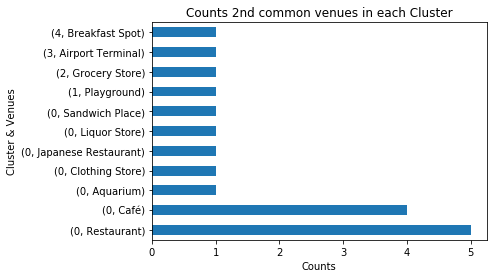

In [434]:
Borough_Merged_Clust.groupby(by='ClustLabels')['2nd Most Common Venue'].value_counts().plot(kind='barh')

plt.xlabel('Counts')
plt.ylabel('Cluster & Venues')
plt.title('Counts 2nd common venues in each Cluster')

# Viz 3rd Most common venues

Text(0.5, 1.0, ' Numbers 3rd Most Common Venues')

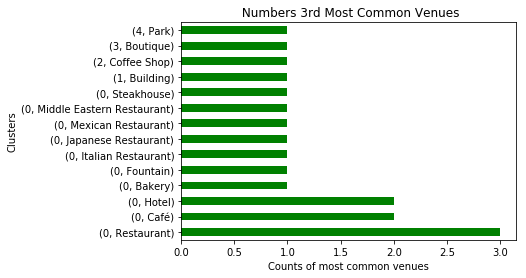

In [435]:
Borough_Merged_Clust.groupby('ClustLabels')['3rd Most Common Venue'].value_counts().plot(kind='barh', color='green')

plt.xlabel('Counts of most common venues')
plt.ylabel('Clusters')

plt.title(' Numbers 3rd Most Common Venues')

# Map Cluster

In [78]:
# create map
Map_Clust = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster, neigh, borough in zip(Borough_Merged['Latitude'], Borough_Merged['Longitude'], Borough_Merged['ClustLabels'], Borough_Merged['Neigh'], Borough_Merged['Borough']):
    label = folium.Popup( str([neigh]) + '  ' + str(borough) + ' ; Cluster ' + str({cluster}), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=9,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(Map_Clust)
       
Map_Clust

# Map Eat(yellow) and Clusters

In [79]:
# create map of Canada using latitude and longitude values
map_Borough = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_Borough)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster, neigh, borough in zip(Borough_Merged['Latitude'], Borough_Merged['Longitude'], Borough_Merged['ClustLabels'], Borough_Merged['Neigh'], Borough_Merged['Borough']):
    label = folium.Popup( str([neigh]) + '  ' + str(borough) + ' ; Cluster ' + str({cluster}), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=9,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(Map_Clust)
    
for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)

for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)


    

       
Map_Clust

# Map Clust with Full venues

In [80]:
# create map
Map_Clust = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)



# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(Map_Clust)

# add markers to the map
markers_colors = []
for lat, lon, cluster, neigh, borough in zip(Borough_Merged['Latitude'], Borough_Merged['Longitude'], Borough_Merged['ClustLabels'], Borough_Merged['Neigh'], Borough_Merged['Borough']):
    label = folium.Popup( str([neigh]) + '  ' + str(borough) + ' ; Cluster ' + str({cluster}), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=13,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.9).add_to(Map_Clust)

for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                             Borough_Toronto_venues['Venue'],Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=3,
    popup=label,
    color='gray',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.3,
    parse_html=False).add_to(Map_Clust)
      

Map_Clust

 

# Map Clusters, all venues(Gray) + Eat venues(yellow)

In [81]:
# create map
Map_Clust = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)



# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(Map_Clust)

# add markers to the map
markers_colors = []
for lat, lon, cluster, neigh, borough in zip(Borough_Merged['Latitude'], Borough_Merged['Longitude'], Borough_Merged['ClustLabels'], Borough_Merged['Neigh'], Borough_Merged['Borough']):
    label = folium.Popup( str([neigh]) + '  ' + str(borough) + ' ; Cluster ' + str({cluster}), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=13,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.9).add_to(Map_Clust)
    
for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                             Borough_Toronto_venues['Venue'],Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=3,
    popup=label,
    color='gray',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.3,
    parse_html=False).add_to(Map_Clust)
    
for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)
    

for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)


Map_Clust


# Map all venues + Eat venues distinct colors (burger=Y,resto=O, Food=G)

In [82]:
# create map
Map_Clust = folium.Map(location=[latitude_Borough, longitude_Borough], zoom_start=11)



# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(Map_Clust)

# add markers to the map
markers_colors = []
for lat, lon, cluster, neigh, borough in zip(Borough_Merged['Latitude'], Borough_Merged['Longitude'], Borough_Merged['ClustLabels'], Borough_Merged['Neigh'], Borough_Merged['Borough']):
    label = folium.Popup( str([neigh]) + '  ' + str(borough) + ' ; Cluster ' + str({cluster}), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=13,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.9).add_to(Map_Clust)
    
for latven, lngven, ven, cat in zip(Borough_Toronto_venues['Venue Latitude'], Borough_Toronto_venues['Venue Longitude'],
                             Borough_Toronto_venues['Venue'],Borough_Toronto_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=3,
    popup=label,
    color='gray',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.3,
    parse_html=False).add_to(Map_Clust)
    
for latven, lngven, ven, cat in zip(Burger_venues['Venue Latitude'], Burger_venues['Venue Longitude'],
                             Burger_venues['Venue'],Burger_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)
    

for latven, lngven, ven, cat in zip(Restaurant_venues['Venue Latitude'], Restaurant_venues['Venue Longitude'],
                             Restaurant_venues['Venue'],Restaurant_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='yellow',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)

for latven, lngven, ven, cat in zip(Food_venues['Venue Latitude'], Food_venues['Venue Longitude'],
                             Food_venues['Venue'],Food_venues['Venue Category']):

    label = '{}, {}'.format(ven,[cat])
    label= folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [latven,lngven],
    radius=4,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3185cc',
    fill_opacity=0.5,
    parse_html=False).add_to(Map_Clust)


Map_Clust


# 4.4 Explore the Cluster 

*You can modify list range for more column*

## Cluster 1

In [83]:
Cluster1 = Borough_Merged.loc[Borough_Merged['ClustLabels'] == 0,Borough_Merged.columns[[1,2,3,4] + list(range(5, Borough_Merged.shape[1]))]]

In [549]:
Cluster1

,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
51,Downtown Toronto,"Cabbagetown,St. James Town",43.667967,-79.367675,0,Coffee Shop,Restaurant,Café,Pizza Place,Japanese Restaurant,Indian Restaurant,Pub,Italian Restaurant,Beer Store,Bistro
52,Downtown Toronto,Church and Wellesley,43.665860,-79.383160,0,Coffee Shop,Restaurant,Japanese Restaurant,Gay Bar,Men's Store,Hotel,Gym,Bubble Tea Shop,Burrito Place,Breakfast Spot
54,Downtown Toronto,"Ryerson,Garden District",43.657162,-79.378937,0,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Sandwich Place,Café,Cosmetics Shop,Hotel,Italian Restaurant,Restaurant,Plaza
55,Downtown Toronto,St. James Town,43.651494,-79.375418,0,Coffee Shop,Restaurant,Hotel,Italian Restaurant,Gastropub,Cocktail Bar,Diner,Café,Beer Bar,Pizza Place
56,Downtown Toronto,Berczy Park,43.644771,-79.373306,0,Cocktail Bar,Liquor Store,Fountain,Park,Coffee Shop,Clothing Store,Breakfast Spot,Lounge,Concert Hall,Beer Bar
57,Downtown Toronto,Central Bay Street,43.657952,-79.387383,0,Coffee Shop,Sandwich Place,Italian Restaurant,Café,Chinese Restaurant,Sushi Restaurant,Tea Room,Bubble Tea Shop,Spa,Indian Restaurant
58,Downtown Toronto,"Adelaide,King,Richmond",43.650571,-79.384568,0,Coffee Shop,Japanese Restaurant,Steakhouse,Café,American Restaurant,Asian Restaurant,Hotel,Bar,Sushi Restaurant,Thai Restaurant
59,Downtown Toronto,"Harbourfront East,Toronto Islands,Union Station",43.640816,-79.381752,0,Coffee Shop,Aquarium,Restaurant,Café,Italian Restaurant,Pizza Place,Hotel,Sandwich Place,Park,Brewery
60,Downtown Toronto,"Design Exchange,Toronto Dominion Centre",43.647177,-79.381576,0,Coffee Shop,Café,Restaurant,Bar,Hotel,Deli / Bodega,American Restaurant,Bakery,Seafood Restaurant,Gym
61,Downtown Toronto,"Commerce Court,Victoria Hotel",43.648198,-79.379817,0,Coffee Shop,Café,Restaurant,Hotel,Gym,American Restaurant,Bakery,Bar,Seafood Restaurant,Gastropub


In [555]:
Cluster1.describe(include='object')

,Borough,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,14,14,14,14,14,14,14,14,14,14,14,14
unique,1,14,4,7,10,12,12,14,12,11,13,12
top,Downtown Toronto,"Ryerson,Garden District",Coffee Shop,Restaurant,Restaurant,Café,Chinese Restaurant,Deli / Bodega,Hotel,Bubble Tea Shop,Seafood Restaurant,Beer Bar
freq,14,1,11,5,3,3,2,1,3,2,2,2


**Look top 3 venues**

In [635]:
Clust1TOP3 = Cluster1[['Neigh', '1st Most Common Venue', '2nd Most Common Venue',
       '3rd Most Common Venue']]

In [636]:
Clust1TOP3

,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
51,"Cabbagetown,St. James Town",Coffee Shop,Restaurant,Café
52,Church and Wellesley,Coffee Shop,Restaurant,Japanese Restaurant
54,"Ryerson,Garden District",Coffee Shop,Clothing Store,Middle Eastern Restaurant
55,St. James Town,Coffee Shop,Restaurant,Hotel
56,Berczy Park,Cocktail Bar,Liquor Store,Fountain
57,Central Bay Street,Coffee Shop,Sandwich Place,Italian Restaurant
58,"Adelaide,King,Richmond",Coffee Shop,Japanese Restaurant,Steakhouse
59,"Harbourfront East,Toronto Islands,Union Station",Coffee Shop,Aquarium,Restaurant
60,"Design Exchange,Toronto Dominion Centre",Coffee Shop,Café,Restaurant
61,"Commerce Court,Victoria Hotel",Coffee Shop,Café,Restaurant


In [637]:
Clust1TOP3.describe(include='object')

,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
count,14,14,14,14
unique,14,4,7,10
top,"Ryerson,Garden District",Coffee Shop,Restaurant,Restaurant
freq,1,11,5,3


 This cluster are the Coffee in Most Common Venue. In 2nd common venus, we are the foreign restaurant ( Italian, Mexican, Japanese).
 
 This segment is for primary commodities and needs
 
 

## Cluster 2

In [84]:
Cluster2 = Borough_Merged.loc[Borough_Merged['ClustLabels'] == 1, Borough_Merged.columns[[1] + list(range(2, Borough_Merged.shape[1]))]]

In [536]:
Cluster2

,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
50,Downtown Toronto,Rosedale,43.679563,-79.377529,1,Bike Trail,Playground,Building,Department Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Dog Run,Dive Bar,Discount Store


In [539]:
Cluster2.describe(include= 'object')

,Borough,Neigh,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,1,1,1,1,1,1,1,1,1,1,1,1
unique,1,1,1,1,1,1,1,1,1,1,1,1
top,Downtown Toronto,Rosedale,Bike Trail,Playground,Building,Department Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Dog Run,Dive Bar,Discount Store
freq,1,1,1,1,1,1,1,1,1,1,1,1


*Cluster 2 : The most common venue is a Bike Trail and Playground*

This segment is for Sport !

## Cluster 3

In [542]:
Cluster3 = Borough_Merged.loc[Borough_Merged['ClustLabels'] == 2, Borough_Merged.columns[[1] + list(range(2, Borough_Merged.shape[1]))]]

In [543]:
Cluster3

,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
75,Downtown Toronto,Christie,43.669542,-79.422564,2,Café,Grocery Store,Coffee Shop,Nightclub,Diner,Italian Restaurant,Baby Store,Wine Bar,Eastern European Restaurant,Dumpling Restaurant


**This cluster it's for the services of all commodities and go to Night Club !**

### Cluster 4

In [577]:
Cluster4 = Borough_Merged.loc[Borough_Merged['ClustLabels'] == 3, Borough_Merged.columns[[2] + list(range(3, Borough_Merged.shape[1]))]]

In [578]:
Cluster4

,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
68,"CN Tower,Bathurst Quay,Island airport,Harbourf...",43.628947,-79.39442,3,Airport Lounge,Airport Terminal,Boutique,Coffee Shop,Airport,Airport Food Court,Airport Gate,Airport Service,Bar,Dog Run


#### *Cluster 4 : This place are a local space in the Airport, with all Airport services !*

### Cluster 5

In [594]:
Cluster5= Borough_Merged.loc[Borough_Merged['ClustLabels'] == 4, Borough_Merged.columns[[2]+ list(range(3, Borough_Merged.shape[1]))]]

In [595]:
Cluster5

,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
53,"Harbourfront,Regent Park",43.65426,-79.360636,4,Coffee Shop,Breakfast Spot,Park,Pub,Spa,Bank,Bakery,Restaurant,Electronics Store,Health Food Store


### Cluster 5 : *Most commons venues are a Coffe Shop, Breakfast Sport, Park, Spa..*
**Place used for well-being near the town center and the Lake !**

## Merged Table with the new name

In [638]:
Borough_Merged_name = Borough_Merged.replace([0,1,2,3,4],['Commodoties','Sport','Night Life','Airport','Well being'])  

In [639]:
Borough_Merged_name = Borough_Merged_name.sort_values('ClustLabels', ascending=False)

In [640]:
Borough_Merged_name

,Post,Borough,Neigh,Latitude,Longitude,ClustLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
53,M5A,Downtown Toronto,"Harbourfront,Regent Park",43.654260,-79.360636,Well being,Coffee Shop,Breakfast Spot,Park,Pub,Spa,Bank,Bakery,Restaurant,Electronics Store,Health Food Store
50,M4W,Downtown Toronto,Rosedale,43.679563,-79.377529,Sport,Bike Trail,Playground,Building,Department Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Dog Run,Dive Bar,Discount Store
75,M6G,Downtown Toronto,Christie,43.669542,-79.422564,Night Life,Café,Grocery Store,Coffee Shop,Nightclub,Diner,Italian Restaurant,Baby Store,Wine Bar,Eastern European Restaurant,Dumpling Restaurant
52,M4Y,Downtown Toronto,Church and Wellesley,43.665860,-79.383160,Commodoties,Coffee Shop,Restaurant,Japanese Restaurant,Gay Bar,Men's Store,Hotel,Gym,Bubble Tea Shop,Burrito Place,Breakfast Spot
54,M5B,Downtown Toronto,"Ryerson,Garden District",43.657162,-79.378937,Commodoties,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Sandwich Place,Café,Cosmetics Shop,Hotel,Italian Restaurant,Restaurant,Plaza
55,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,Commodoties,Coffee Shop,Restaurant,Hotel,Italian Restaurant,Gastropub,Cocktail Bar,Diner,Café,Beer Bar,Pizza Place
56,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,Commodoties,Cocktail Bar,Liquor Store,Fountain,Park,Coffee Shop,Clothing Store,Breakfast Spot,Lounge,Concert Hall,Beer Bar
57,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383,Commodoties,Coffee Shop,Sandwich Place,Italian Restaurant,Café,Chinese Restaurant,Sushi Restaurant,Tea Room,Bubble Tea Shop,Spa,Indian Restaurant
58,M5H,Downtown Toronto,"Adelaide,King,Richmond",43.650571,-79.384568,Commodoties,Coffee Shop,Japanese Restaurant,Steakhouse,Café,American Restaurant,Asian Restaurant,Hotel,Bar,Sushi Restaurant,Thai Restaurant
51,M4X,Downtown Toronto,"Cabbagetown,St. James Town",43.667967,-79.367675,Commodoties,Coffee Shop,Restaurant,Café,Pizza Place,Japanese Restaurant,Indian Restaurant,Pub,Italian Restaurant,Beer Store,Bistro


In [641]:
Clust_path = 'C:/Users/Mokht\OneDrive/Bureau/ClustK5_name.xlsx'

In [643]:
Borough_Merged_name.to_csv(Clust_path)